In [1]:
import os
import sys
import torch
import os.path
import argparse
import urllib.request

import mlflow
import mlflow.pytorch

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from data import *
from utils import *
from ExtraLoss import *

from datetime import datetime
from sklearn.mixture import GaussianMixture as GMM
from sklearn.model_selection import train_test_split

sys.path.append(os.path.join(os.getcwd(), '..', '..', 'Disentanglement'))
sys.path.append(os.path.join(os.getcwd(), '..', '..', 'Accuracy'))

from DCI import compute_dci, report_dci
from IRS import compute_irs_from_multihot_labels, report_irs
from MIG import compute_mig, report_mig
from TCM import compute_tcm

from BA import mh_binary_accuracy

In [2]:
parser = argparse.ArgumentParser(description='Gen-RKM Model')

parser.add_argument('--N', type=int, default=5_000, help='Total # of samples') # 2_000 -> 5_000
parser.add_argument('--mb_size', type=int, default=32, help='Mini-batch size. See utils.py') # 64 -> 32; maybe 48?
parser.add_argument('--h_dim', type=int, default=48, help='Dim of latent vector') # 48 -> 64; maybe 64
parser.add_argument('--capacity', type=int, default=48, help='Capacity of network. See utils.py')

parser.add_argument('--x_fdim', type=int, default=256, help='Input x_fdim. See utils.py')
parser.add_argument('--y_fdim', type=int, default=256, help='Input y_fdim. See utils.py')
parser.add_argument('--z_fdim', type=int, default=64, help='Input z_fdim. See utils.py')

parser.add_argument('--c_accu', type=float, default=50, help='Input weight on recons_error')
parser.add_argument('--start_iter', type=int, default=0, help='Input start_iter for training')

parser.add_argument('--lr', type=float, default=7e-05, help='Input learning rate for optimizer') # 1e-4 -> 7e-5 -> 5e-5
parser.add_argument('--max_epochs', type=int, default=0, help='Input max_epoch for cut-off') # 100 -> 300 -> 500
parser.add_argument('--device', type=str, default='cpu', help='Device type: cuda or cpu')
parser.add_argument('--workers', type=int, default=0, help='# of workers for dataloader')
parser.add_argument('--shuffle', type=bool, default=True, help='shuffle dataset: true or false')

opt, _ = parser.parse_known_args()

h_dim = opt.h_dim

In [3]:
xtrain, xtest, ipVec_dim, nChannels = get_mmcelebahq_dataloader(args=opt)

info 0 5000 1


/Users/arthurclarysse/Desktop/🎓/03 Masterproef CS/VUB-MT-Development/Models/GenRKM-MMCelebHQ-V3/data.py:31: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:4483.)
  label = torch.tensor(label, dtype=torch.double).T


info 5001 10001 1


In [4]:
ct = time.strftime("%Y%m%d-%H%M")
dirs = create_dirs(ct=ct)
dirs.create()

In [5]:
mlflow.end_run()
mlflow.set_tracking_uri("file:./mlruns")

mlflow.set_tracking_uri("file:./mlruns")
experiment_name = "GenRKM-MMCelebAHQ-1V"

mlflow.set_experiment(experiment_name)
exp = mlflow.get_experiment_by_name(experiment_name)

print("Tracking URI:", mlflow.get_tracking_uri())
print("Experiment:", exp.name)
print("Experiment ID:", exp.experiment_id)

run_name = f"GenRKM-{opt.max_epochs}-{opt.h_dim}-{opt.capacity}-{ct}"

Tracking URI: file:./mlruns
Experiment: GenRKM-MMCelebAHQ-1V
Experiment ID: 812052346738468545


/opt/anaconda3/envs/MT-Dev2/lib/python3.13/site-packages/mlflow/tracking/_tracking_service/utils.py:184: FutureWarning: The filesystem tracking backend (e.g., './mlruns') is deprecated as of February 2026. Consider transitioning to a database backend (e.g., 'sqlite:///mlflow.db') to take advantage of the latest MLflow features. See https://mlflow.org/docs/latest/self-hosting/migrate-from-file-store for migration guidance.
  return FileStore(store_uri, store_uri)


In [6]:
def kPCA(X, eps=1e-6):
    # Kernel matrix (B,B)
    # print('Shapes of KPCA input:', X.shape, Y.shape, Z.shape)

    a = X @ X.T
    B = a.size(0)

    # Centering (same dtype/device as a)
    oneN = torch.ones(B, B, device=a.device, dtype=a.dtype) / B
    a = a - oneN @ a - a @ oneN + oneN @ a @ oneN

    # Force symmetry (numerical)
    a = 0.5 * (a + a.T)

    # Add small jitter to diagonal for conditioning
    a = a + eps * torch.eye(B, device=a.device, dtype=a.dtype)

    # Eigen-decomposition (ascending eigenvalues)
    evals, evecs = torch.linalg.eigh(a)

    # Sort descending
    idx = torch.argsort(evals, descending=True)
    evals = evals[idx]
    evecs = evecs[:, idx]

    # Return top components
    h = evecs[:, :h_dim]
    s = evals  # (B,)

    return h, s

In [7]:
# Energy function
def my_loss(output_im, data_im):
    h, s = kPCA(output_im)
    U = torch.mm(torch.t(output_im), h)
    x_im_tilde = net_im_de(torch.mm(h, torch.t(U)))

    # cost
    f1 = torch.trace(torch.mm(torch.mm(output_im, U), torch.t(h)))
    f2 = 0.5 * torch.trace(torch.mm(h, torch.mm(torch.diag(s[:h_dim]), torch.t(h))))
    f3 = 0.5 * (torch.trace(torch.mm(torch.t(U), U)))

    recon_loss1 = torch.nn.MSELoss()
    f4 = recon_loss1(x_im_tilde.view(-1, 49152), data_im.view(-1, 49152))

    loss = - f1 + f3 + f2 + 0.5 * (- f1 + f3 + f2) ** 2 + 100 * f4
    return loss

In [8]:
net_im_en = NetImEn(opt).double().to(opt.device)
net_im_de = NetImDe(opt).double().to(opt.device)

In [9]:
params = list(net_im_en.parameters()) + list(net_im_de.parameters())

optimizer = torch.optim.AdamW(params, lr=opt.lr, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    threshold=1e-3,
    cooldown=0,
    min_lr=1e-6,
)

l_cost = 6  # Costs from where checkpoints will be saved
t = 1
cost = np.inf  # Initialize cost

losses = []

In [10]:
# global_step = 0
# run_id = 0

# with mlflow.start_run(experiment_id=exp.experiment_id, run_name=run_name) as run:
#     run_id = run.info.run_id
    
#     mlflow.log_params({
#         "N": opt.N,
#         "mb_size": opt.mb_size,
#         "h_dim": opt.h_dim,
#         "capacity": opt.capacity,
#         "x_fdim": opt.x_fdim,
#         "y_fdim": opt.y_fdim,
#         "z_fdim": opt.z_fdim,
#         "c_accu": opt.c_accu,
#         "start_iter": opt.start_iter,
#         "lr": opt.lr,
#         "max_epochs": opt.max_epochs,
#         "device": opt.device,
#         "workers": opt.workers,
#         "shuffle": opt.shuffle,
#     })

#     while t <= opt.max_epochs:
#         avg_loss = 0

#         for i, (data_im, _, _) in enumerate(xtrain):
#             data_im = data_im.to(opt.device)
#             output_im = net_im_en(data_im)

#             loss = my_loss(output_im, data_im)

#             optimizer.zero_grad()
#             loss.backward()
#             torch.nn.utils.clip_grad_norm_(params, 1.0)
#             optimizer.step()

#             mlflow.log_metric("train_batch_loss", loss.item(), step=global_step)
#             mlflow.log_metric("learning_rate", optimizer.param_groups[0]['lr'], step=global_step)
#             global_step += 1
#             avg_loss += loss.detach().cpu().numpy()

#         cost = avg_loss / len(xtrain)
#         losses.append(cost)
#         scheduler.step(cost)

#         mlflow.log_metric("train_epoch_loss", float(cost), step=t)
#         t += 1

In [11]:
# # Get latest model
# if os.path.exists('cp/{}'.format(dirs.dircp)):
#     sd_mdl = torch.load('cp/{}'.format(dirs.dircp), weights_only=False)
#     net_im_en.load_state_dict(sd_mdl['net_im_en_state_dict'])
#     net_im_de.load_state_dict(sd_mdl['net_im_de_state_dict'])

# U, h, s = mmcelebahq_final_compute_1V(opt, net_im_en, kPCA)

In [12]:
# # Save Model
# torch.save({'net_im_en': net_im_en,
#             'net_im_de': net_im_de,
#             'net_im_en_state_dict': net_im_en.state_dict(),
#             'net_im_de_state_dict': net_im_de.state_dict(),
#             'data_im': data_im,
#             'classes': get_classes()
#         }, 'out/{}'.format(dirs.dirout))

In [13]:
# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.pytorch.log_model(net_im_en, name="net_im_en")
#     mlflow.pytorch.log_model(net_im_de, name="net_im_de")

#     mlflow.log_artifact(f"out/{dirs.dirout}")
#     mlflow.log_artifacts("cp")

In [14]:
model = torch.load('./out/Final-1V.tar', weights_only=False)

data_im = model['data_im']
net_im_en = model['net_im_en']
net_im_de = model['net_im_de']

## Evaluation

In [15]:
# Collect & Encode all Test Data
all_im_en = []
all_data_im = []
all_data_la = []

with torch.no_grad():
    for data_im, data_sk, data_la in xtest:
        data_im = data_im.to(opt.device)
        im_en = net_im_en(data_im)
        all_im_en.append(im_en)
        all_data_im.append(data_im)
        all_data_la.append(data_la)

In [16]:
# Make one big tensor for each view
all_im_en = torch.cat(all_im_en, dim=0)
all_data_im = torch.cat(all_data_im, dim=0)
all_data_la = torch.cat(all_data_la, dim=0)

In [17]:
# Compute kPCA to get U, V, and W fgor the complete test set
with torch.no_grad():
    h_test, _ = kPCA(all_im_en)
    U_test = all_im_en.T @ h_test
    x_im_tilde_test = net_im_de(h_test @ U_test.T)

### Plot 10 Image Reconstructions

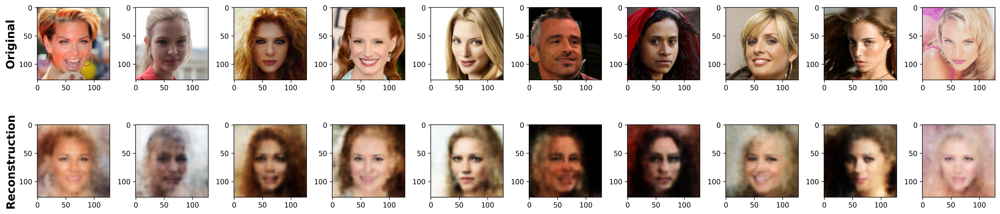

In [18]:
n = 10
fig, axes = plt.subplots(2, n, figsize=(2*n, 5), dpi=300)

for i in range(n):
    axes[0, i].imshow(all_data_im[i].detach().cpu().permute(1, 2, 0).squeeze(), cmap='gray')

    axes[1, i].imshow(x_im_tilde_test[i].detach().cpu().permute(1, 2, 0).squeeze(), cmap='gray')

    # For each row 1 y-axis label
    if i == 0:
        axes[0, i].set_ylabel("Original", fontsize=16, fontweight='bold')
        axes[1, i].set_ylabel("Reconstruction", fontsize=16, fontweight='bold')

plt.tight_layout()
# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_figure(fig, "plots/reconstructions.png")
plt.show()

In [19]:
# Calculate losses for all test data
recon_loss1 = torch.nn.MSELoss()

test_im_all = recon_loss1(x_im_tilde_test.view(-1, 49152), all_data_im.view(-1, 49152)).item()

# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_metric("test_image_loss", test_im_all)

print(f"Test Image Loss: {test_im_all:.4f}")

Test Image Loss: 0.0151


### Plot 1 Sample Reconstruction

In [20]:
target_index = 0

in_image = all_data_im[target_index].permute(1, 2, 0)
out_image = x_im_tilde_test[target_index].permute(1, 2, 0)

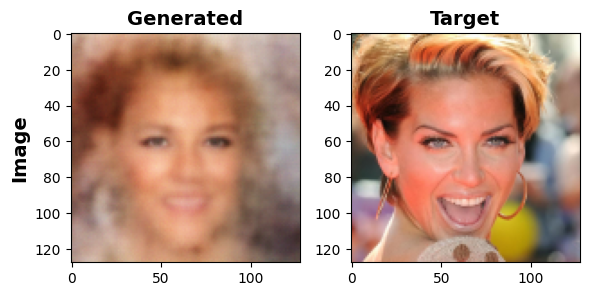

In [21]:
# Plot Image + Sketch
fig, ax = plt.subplots(1, 2, figsize=(6, 6))

ax[0].imshow(out_image)
ax[0].set_title('Generated', size=14, weight='bold')
ax[0].set_ylabel('Image', rotation=90, size=14, weight='bold')

ax[1].imshow(in_image)
ax[1].set_title('Target', size=14, weight='bold')

plt.tight_layout()
# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_figure(fig, "plots/generated_vs_target_image_sketch.png")
plt.show()
plt.close(fig)

## Disentanglement

In [22]:
# Variables with correlation < 0.3, see data_analysis.ipynb
attr_names = ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']
Z_subset = ['Brown_Hair','Pointy_Nose','Bangs','Blurry','Straight_Hair','Wavy_Hair','Oval_Face','Blond_Hair','Arched_Eyebrows','Wearing_Hat','Sideburns','Wearing_Earrings','Bald']


class_names = get_classes()
subset_indices = [class_names.index(cls) for cls in Z_subset]

In [23]:
# C_batches = []
# Z_raw_batches = []

# with torch.no_grad():
#     for data_im, data_sk, data_la in xtest:   # use xtest for final DCI
#         data_im = data_im.to(opt.device)
#         data_sk = data_sk.to(opt.device)
#         data_la = data_la.to(opt.device)

#         # Encode all three views
#         data_im_en = net_im_en(data_im)
#         data_sk_en = net_sk_en(data_sk)
#         data_la_en = net_la_en(data_la)

#         # Shared latent representation
#         h, _ = kPCA(data_im_en, data_sk_en, data_la_en)

#         # Store latent codes and raw labels
#         C_batches.append(h.cpu().numpy())
#         Z_raw_batches.append(data_la.cpu().numpy())

C = h_test
Z = all_data_la

In [24]:
factor_types = ['discrete'] * Z.size(1)

In [32]:
C

tensor([[ 0.0100, -0.0119,  0.0110,  ..., -0.0127,  0.0093, -0.0057],
        [ 0.0269,  0.0062,  0.0035,  ..., -0.0152,  0.0127, -0.0017],
        [-0.0058,  0.0063, -0.0296,  ...,  0.0267, -0.0157, -0.0074],
        ...,
        [-0.0090, -0.0141,  0.0015,  ...,  0.0025,  0.0183,  0.0026],
        [ 0.0258, -0.0061,  0.0060,  ..., -0.0017,  0.0252, -0.0028],
        [ 0.0194,  0.0260, -0.0039,  ..., -0.0106, -0.0048, -0.0300]],
       dtype=torch.float64)

In [ ]:
 Z

tensor([[0., 1., 1.,  ..., 0., 0., 1.],
        [0., 0., 1.,  ..., 0., 0., 1.],
        [0., 0., 0.,  ..., 0., 0., 1.],
        ...,
        [0., 1., 1.,  ..., 0., 0., 1.],
        [0., 0., 1.,  ..., 0., 0., 1.],
        [1., 0., 0.,  ..., 0., 0., 0.]], dtype=torch.float64)

### DCI
> **$D$**: Latent encoding -> Factor <br>
> **$C$**: Factor -> Latent encoding <br>
> **$I$**: How well the factors can be predicted at all (predictive performance). <br>

In [25]:
res = compute_dci(C=C, Z=Z, factor_types=factor_types, probe="lasso")
report_dci(res, title="DCI")

# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_metric("DCI_disentanglement_subset", res.D)
#     mlflow.log_metric("DCI_completeness_subset", res.C)
#     mlflow.log_metric("DCI_informativeness_subset", res.I)

--- DCI ---
 > Disentanglement: 0.0712
 > Completeness: 0.103
 > Informativeness: 0.8398


### IRS

In [26]:
irs_res = compute_irs_from_multihot_labels(C, Z)
report_irs(irs_res, title="IRS")

# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_metric("IRS_subset", irs_res['IRS'])

IRS score: 0.2707
Per-latent disentanglement scores: [0.26664202 0.27630657 0.34820011 0.301213   0.24742505 0.21737459
 0.20656496 0.27246216 0.31385152 0.25038828 0.31270405 0.25981797
 0.2804304  0.34273801 0.21743684 0.28824166 0.22693812 0.16509982
 0.24495303 0.36629691 0.26578122 0.25065385 0.30932741 0.25212666
 0.3601171  0.24629264 0.29626992 0.2906206  0.28194403 0.25286622
 0.18130304 0.26323575 0.25891082 0.32916297 0.25070369 0.292214
 0.27749949 0.1683782  0.32167275 0.21797832 0.25344614 0.30823528
 0.24810069 0.19159948 0.28821778 0.27958257 0.26059683 0.24542595]
Max deviations per latent: [0.04411008 0.05233286 0.05721359 0.08098459 0.06264966 0.05441294
 0.05376387 0.07100414 0.06436107 0.05739472 0.06688345 0.05504751
 0.07012115 0.06311415 0.06172952 0.059151   0.06264347 0.05932084
 0.07172131 0.07823666 0.06317246 0.06227678 0.07570568 0.06177295
 0.09939806 0.05982504 0.06763433 0.0687045  0.06959797 0.0643373
 0.06393278 0.05668156 0.06007641 0.06460016 0.0573

### MIG

In [27]:
mig_res = compute_mig(C, Z)
report_mig(mig_res, title="MIG")

# with mlflow.start_run(run_id=run_id, nested=True):
#     mlflow.log_metric("MIG_subset", mig_res['MIG'])

MIG score: 0.0156
Per-factor MIG: [0.0534917  0.00854282 0.03552007 0.00157763 0.09284883 0.01947338
 0.00041205 0.00629387 0.02122598 0.02013565 0.02136615 0.01064778
 0.00142156 0.0367549  0.00195222 0.0053849  0.00925376 0.04767977
 0.01851039 0.00918565 0.04291921 0.00079686 0.00356048 0.01944336
 0.01823391 0.02163415 0.00401435 0.00370666 0.00059384 0.00880819
 0.00249701 0.01231654 0.00019289 0.02592834 0.00336994 0.00688947
 0.01505917 0.00834311 0.00145136 0.00066998]
Factor entropies: [0.40826607 0.67561629 0.67591771 0.60628162 0.0886591  0.45695186
 0.67310901 0.62890003 0.51200738 0.48491905 0.02388251 0.55175323
 0.48287117 0.23270533 0.20460439 0.15056992 0.22888137 0.13490925
 0.69311508 0.68715375 0.61278684 0.69131613 0.21663505 0.37871461
 0.43609172 0.42898137 0.20865315 0.64231855 0.2771224  0.3744247
 0.26819248 0.68670567 0.51991428 0.6655198  0.59876708 0.14856507
 0.66646641 0.48926429 0.2277825  0.48811128]
Valid factors: [ True  True  True  True  True  True  

In [28]:
# plt.figure(figsize=(12, 8))
# sns.heatmap(
#     mig_res["MIG_matrix"],
#     annot=False,
#     fmt=".4f",
#     cmap="YlGnBu",
#     cbar_kws={'label': 'MIG Score'},
#     vmin=0,
#     vmax=1
# )
# plt.title('MIG Matrix Heatmap', size=14, weight='bold')
# plt.ylabel('Latent Dimensions', size=12, weight='bold')
# plt.xlabel('Factors', size=12, weight='bold')

# with mlflow.start_run(run_id=run_id):
#     mlflow.log_figure(plt.gcf(), "plots/mig_matrix_heatmap.png")

# plt.show()
# plt.close()

### 3Char-M

In [29]:
tcm_results = compute_tcm(Z.cpu().numpy(), C.cpu().numpy())

print(f'--- TCM Scores ---')
print(f' > TCM: {round(tcm_results, 4)}')

--- TCM Scores ---
 > TCM: 0.0065


## Latent Visualization

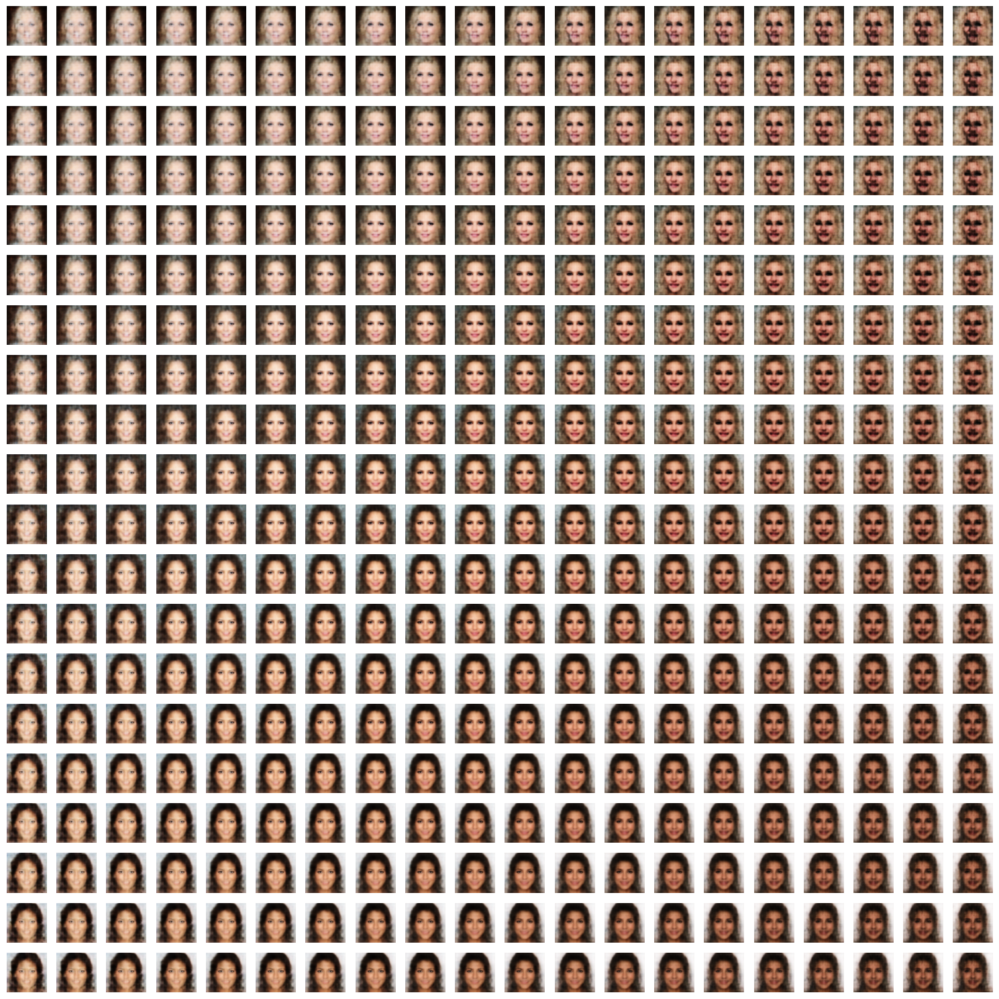

In [30]:
dim1 = 0
dim2 = 1

# Grid Walk
n_steps = 20

fig, axes = plt.subplots(n_steps, n_steps, figsize=(15, 15))

walk_dim1 = torch.linspace(C[:, dim1].min(), C[:, dim1].max(), steps=n_steps).to(opt.device)
walk_dim2 = torch.linspace(C[:, dim2].min(), C[:, dim2].max(), steps=n_steps).to(opt.device)

with torch.no_grad():
    for row in range(n_steps):
        for col in range(n_steps):
            z_walk = torch.zeros(1, opt.h_dim, device=opt.device).double()  # Start with a zero vector
            z_walk[0, dim1] = walk_dim1[col]   # columns
            z_walk[0, dim2] = walk_dim2[row]   # rows

            x_tilde_walk = net_im_de(torch.mm(z_walk, U_test.t()))
            axes[row, col].imshow(x_tilde_walk[0].cpu().numpy().transpose(1, 2, 0), cmap='gray')
            axes[row, col].axis('off')

plt.tight_layout()
plt.savefig("./img/lv/1V-D12", dpi=300)
plt.show()

*First two dimension clearly represent woman -> man and square face -> round face*

/var/folders/yd/xmg755ln3fscr3pf2_0xpclm0000gn/T/ipykernel_1462/2219561025.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  z_base = torch.tensor(C.mean(axis=0), device=opt.device).unsqueeze(0).double()


KeyboardInterrupt: 

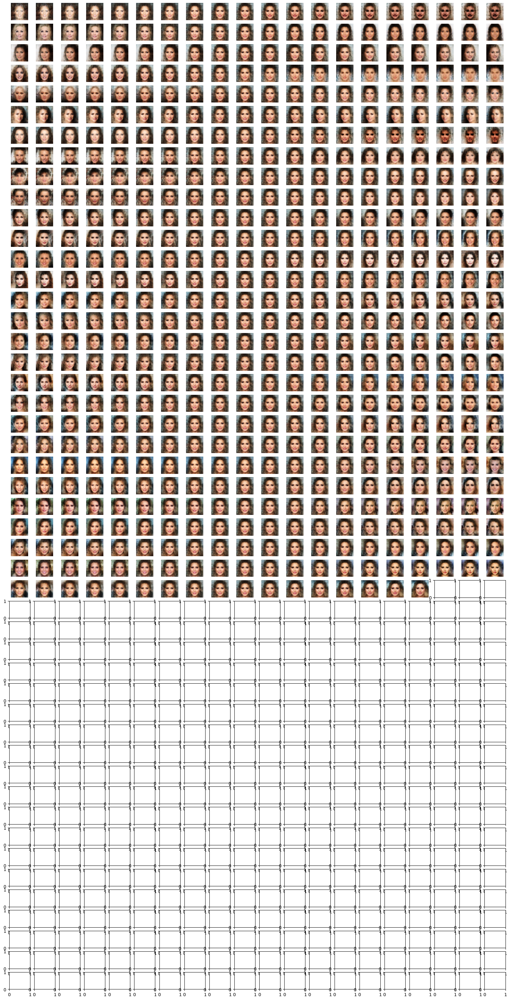

In [31]:
fig, axes = plt.subplots(opt.h_dim, n_steps, figsize=(20, 40))

with torch.no_grad():
    for dim in range(opt.h_dim):
        walk_dim = torch.linspace(C[:, dim].min(), C[:, dim].max(), steps=n_steps).to(opt.device)

        for step in range(n_steps):
            z_base = torch.tensor(C.mean(axis=0), device=opt.device).unsqueeze(0).double()
            z_walk = z_base.clone()
            z_walk[0, dim] = walk_dim[step]

            x_tilde_walk = net_im_de(torch.mm(z_walk, U_test.t()))

            axes[dim, step].imshow(x_tilde_walk[0].cpu().numpy().transpose(1, 2, 0), cmap='gray')
            axes[dim, step].axis('off')

plt.tight_layout()
plt.savefig("./img/lv/1V-DA", dpi=300)
plt.show()
